In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
def patch_together_nearest(G, position):
    list_of_all_nodes = np.array(range(G.numberOfNodes()))
    
    cc = nk.components.ConnectedComponents(G)
    cc.run()
    components = cc.getComponents()
    number_of_components = cc.numberOfComponents()
    
    bridges = 1
    
    while number_of_components != 1:

            

        compA = np.array(components[0])
        compB = np.delete(list_of_all_nodes, compA)


        pointsA = position[compA]
        pointsB = position[compB]
        
        diff = pairwise_distances(pointsA, pointsB, n_jobs=-1)

        top_bridges = np.argpartition(diff.flatten(), bridges)[0:bridges]
        indices = np.unravel_index(top_bridges, diff.shape)
        nodesA = compA[indices[0]]
        nodesB = compB[indices[1]]

        for i in range(bridges):
            try:
                nodeA = nodesA[i]
                nodeB = nodesB[i]
            except:
                print(nodesA, nodesB, indices, top_bridges, compA, compB)
                raise RuntimeError("Bug somewhere")
            distance = norm(position[nodeA] - position[nodeB])
            if not G.hasEdge(nodeA, nodeB):
                G.addEdge(nodeA, nodeB, distance)

                    
        cc = nk.components.ConnectedComponents(G)
        cc.run()
        components = cc.getComponents()
        number_of_components = cc.numberOfComponents()
        
    return G

In [6]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "eth_CC"

threshold = 12

# for the filename
parameters = "2-0_5-12"

In [7]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)
    
    
################################
###   apply the fitltering   ###
################################
from cluster_filter import cfilter
number_of_nodes = len(position)
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))

cluster_centers, labels, position, pca, embedding = cfilter(*k_means_pp(k, pca, return_labels=True), position, pca, embedding)
number_of_nodes = len(pca)
################################


unique_labels = np.unique(labels)

print("Time for data preperation: ", time.time()-start)

sklearn is done: 28.335022449493408
My own part is done: 1.127293348312378
Time for data preperation:  93.54258632659912


In [8]:
np.sum(np.sort(labels)[1:]-np.sort(labels)[:-1] > 1)

0

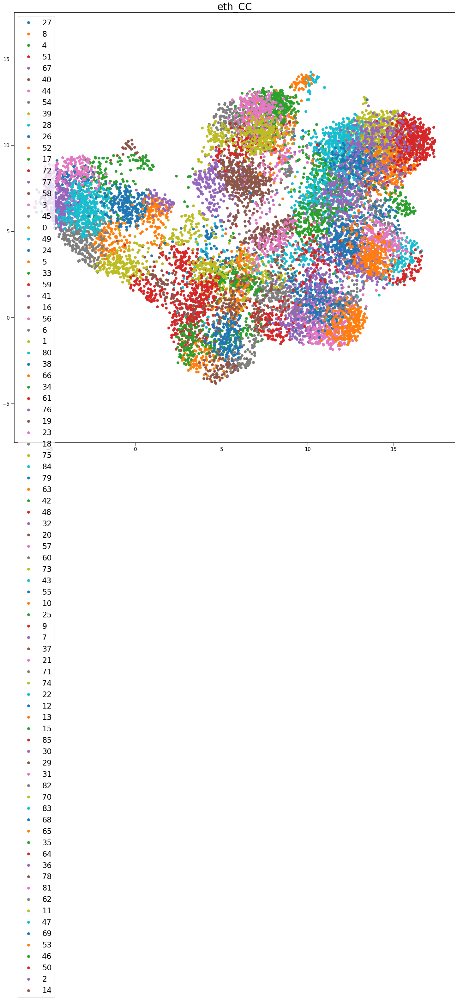

In [9]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
plt.show()

In [10]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=11,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/83 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/100 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/894 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/894 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/894 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/99 [00:00<?, ?it/s]

update Arr 894 -> 798
update Arr 798 -> 721
update Arr 721 -> 648
update Arr 648 -> 587
update Arr 587 -> 523
update Arr 523 -> 474
update Arr 474 -> 428
update Arr 428 -> 388
update Arr 388 -> 352
update Arr 352 -> 316
update Arr 316 -> 279
update Arr 279 -> 250
update Arr 250 -> 224
update Arr 224 -> 203
update Arr 203 -> 184
update Arr 184 -> 166
update Arr 166 -> 143
update Arr 143 -> 127
update Arr 127 -> 109
update Arr 109 -> 107
update Arr 107 -> 104
update Arr 104 -> 102
update Arr 102 -> 101
update Arr 101 -> 100


calculating the densities for the density criterion:   0%|          | 0/89 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/773 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/773 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/773 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 773 -> 695
update Arr 695 -> 627
update Arr 627 -> 562
update Arr 562 -> 510
update Arr 510 -> 460
update Arr 460 -> 416
update Arr 416 -> 378
update Arr 378 -> 336
update Arr 336 -> 301
update Arr 301 -> 265
update Arr 265 -> 235
update Arr 235 -> 212
update Arr 212 -> 188
update Arr 188 -> 165
update Arr 165 -> 137
update Arr 137 -> 121
update Arr 121 -> 107
update Arr 107 -> 96
update Arr 96 -> 93
update Arr 93 -> 89
update Arr 89 -> 89
update Arr 89 -> 88


calculating the densities for the density criterion:   0%|          | 0/276 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2754 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2754 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2754 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/275 [00:00<?, ?it/s]

update Arr 2754 -> 2478
added 6 edges early
update Arr 2478 -> 2231
update Arr 2231 -> 2024
update Arr 2024 -> 1839
update Arr 1839 -> 1667
update Arr 1667 -> 1515
update Arr 1515 -> 1373
update Arr 1373 -> 1247
update Arr 1247 -> 1117
update Arr 1117 -> 1008
update Arr 1008 -> 912
update Arr 912 -> 828
update Arr 828 -> 752
update Arr 752 -> 676
update Arr 676 -> 612
update Arr 612 -> 555
update Arr 555 -> 503
update Arr 503 -> 455
update Arr 455 -> 409
update Arr 409 -> 366
update Arr 366 -> 331
update Arr 331 -> 297
update Arr 297 -> 284
update Arr 284 -> 284
update Arr 284 -> 282
update Arr 282 -> 280
update Arr 280 -> 277
update Arr 277 -> 276


calculating the densities for the density criterion:   0%|          | 0/91 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/883 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/883 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/883 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/90 [00:00<?, ?it/s]

update Arr 883 -> 791
update Arr 791 -> 697
update Arr 697 -> 624
update Arr 624 -> 544
update Arr 544 -> 493
update Arr 493 -> 448
update Arr 448 -> 407
update Arr 407 -> 368
update Arr 368 -> 329
update Arr 329 -> 294
update Arr 294 -> 258
update Arr 258 -> 233
update Arr 233 -> 207
update Arr 207 -> 181
update Arr 181 -> 154
update Arr 154 -> 134
update Arr 134 -> 121
update Arr 121 -> 107
update Arr 107 -> 93
update Arr 93 -> 93
update Arr 93 -> 92


calculating the densities for the density criterion:   0%|          | 0/104 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/928 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/928 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/928 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/103 [00:00<?, ?it/s]

update Arr 928 -> 843
update Arr 843 -> 758
update Arr 758 -> 689
update Arr 689 -> 622
update Arr 622 -> 559
update Arr 559 -> 506
update Arr 506 -> 459
update Arr 459 -> 411
update Arr 411 -> 366
update Arr 366 -> 329
update Arr 329 -> 297
update Arr 297 -> 257
update Arr 257 -> 233
update Arr 233 -> 204
update Arr 204 -> 180
update Arr 180 -> 157
update Arr 157 -> 141
update Arr 141 -> 128
update Arr 128 -> 113
update Arr 113 -> 111
update Arr 111 -> 108
update Arr 108 -> 106
update Arr 106 -> 105
update Arr 105 -> 103


calculating the densities for the density criterion:   0%|          | 0/118 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1135 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1135 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1135 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/117 [00:00<?, ?it/s]

update Arr 1135 -> 1029
update Arr 1029 -> 908
update Arr 908 -> 758
update Arr 758 -> 686
update Arr 686 -> 617
update Arr 617 -> 558
update Arr 558 -> 504
update Arr 504 -> 458
update Arr 458 -> 415
update Arr 415 -> 375
update Arr 375 -> 339
update Arr 339 -> 301
update Arr 301 -> 267
update Arr 267 -> 238
update Arr 238 -> 213
update Arr 213 -> 188
update Arr 188 -> 169
update Arr 169 -> 151
update Arr 151 -> 135
update Arr 135 -> 127
update Arr 127 -> 123
update Arr 123 -> 120
update Arr 120 -> 119
update Arr 119 -> 118


calculating the densities for the density criterion:   0%|          | 0/169 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1624 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1624 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1624 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/168 [00:00<?, ?it/s]

update Arr 1624 -> 1468
update Arr 1468 -> 1308
update Arr 1308 -> 1187
update Arr 1187 -> 1074
update Arr 1074 -> 967
update Arr 967 -> 878
update Arr 878 -> 758
update Arr 758 -> 687
update Arr 687 -> 622
update Arr 622 -> 560
update Arr 560 -> 506
update Arr 506 -> 459
update Arr 459 -> 415
update Arr 415 -> 376
update Arr 376 -> 341
update Arr 341 -> 304
update Arr 304 -> 270
update Arr 270 -> 244
update Arr 244 -> 217
update Arr 217 -> 197
update Arr 197 -> 177
update Arr 177 -> 175
update Arr 175 -> 174
update Arr 174 -> 172
update Arr 172 -> 171
update Arr 171 -> 170
update Arr 170 -> 168


calculating the densities for the density criterion:   0%|          | 0/154 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1520 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1520 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1520 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/153 [00:00<?, ?it/s]

update Arr 1520 -> 1328
update Arr 1328 -> 1202
update Arr 1202 -> 1089
update Arr 1089 -> 983
update Arr 983 -> 891
update Arr 891 -> 803
update Arr 803 -> 727
update Arr 727 -> 658
update Arr 658 -> 595
update Arr 595 -> 536
update Arr 536 -> 482
update Arr 482 -> 434
update Arr 434 -> 391
update Arr 391 -> 347
update Arr 347 -> 315
update Arr 315 -> 285
update Arr 285 -> 258
update Arr 258 -> 234
update Arr 234 -> 210
update Arr 210 -> 190
update Arr 190 -> 167
update Arr 167 -> 162
update Arr 162 -> 160
update Arr 160 -> 158
update Arr 158 -> 156
update Arr 156 -> 154


calculating the densities for the density criterion:   0%|          | 0/131 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1258 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1258 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1258 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/130 [00:00<?, ?it/s]

update Arr 1258 -> 1137
update Arr 1137 -> 1012
update Arr 1012 -> 912
update Arr 912 -> 829
update Arr 829 -> 748
update Arr 748 -> 678
update Arr 678 -> 606
update Arr 606 -> 549
update Arr 549 -> 496
update Arr 496 -> 450
update Arr 450 -> 399
update Arr 399 -> 358
update Arr 358 -> 321
update Arr 321 -> 283
update Arr 283 -> 246
update Arr 246 -> 221
update Arr 221 -> 199
update Arr 199 -> 174
update Arr 174 -> 153
update Arr 153 -> 134
added 2 edges early
update Arr 134 -> 134
update Arr 134 -> 133
update Arr 133 -> 132
update Arr 132 -> 131
update Arr 131 -> 131


calculating the densities for the density criterion:   0%|          | 0/131 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1240 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1240 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1240 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/130 [00:00<?, ?it/s]

update Arr 1240 -> 1100
update Arr 1100 -> 955
update Arr 955 -> 867
update Arr 867 -> 785
update Arr 785 -> 711
update Arr 711 -> 636
update Arr 636 -> 573
update Arr 573 -> 516
update Arr 516 -> 469
update Arr 469 -> 420
update Arr 420 -> 381
update Arr 381 -> 339
update Arr 339 -> 308
update Arr 308 -> 275
update Arr 275 -> 247
update Arr 247 -> 224
update Arr 224 -> 200
update Arr 200 -> 180
update Arr 180 -> 163
update Arr 163 -> 146
update Arr 146 -> 140
update Arr 140 -> 138
update Arr 138 -> 135
update Arr 135 -> 132
update Arr 132 -> 131


calculating the densities for the density criterion:   0%|          | 0/611 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/6173 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/6173 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/6173 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/610 [00:00<?, ?it/s]

update Arr 6173 -> 5598
added 8 edges early
update Arr 5598 -> 5067
update Arr 5067 -> 4595
update Arr 4595 -> 4072
update Arr 4072 -> 3701
update Arr 3701 -> 3360
update Arr 3360 -> 3051
update Arr 3051 -> 2772
update Arr 2772 -> 2515
update Arr 2515 -> 2286
update Arr 2286 -> 2076
update Arr 2076 -> 1885
update Arr 1885 -> 1706
update Arr 1706 -> 1548
update Arr 1548 -> 1406
update Arr 1406 -> 1275
update Arr 1275 -> 1153
update Arr 1153 -> 1044
update Arr 1044 -> 944
update Arr 944 -> 857
update Arr 857 -> 778
update Arr 778 -> 706
update Arr 706 -> 641
update Arr 641 -> 619
update Arr 619 -> 618
update Arr 618 -> 615
update Arr 615 -> 613
update Arr 613 -> 612
update Arr 612 -> 611


calculating the densities for the density criterion:   0%|          | 0/162 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1512 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1512 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1512 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/161 [00:00<?, ?it/s]

update Arr 1512 -> 1360
update Arr 1360 -> 1232
update Arr 1232 -> 1116
update Arr 1116 -> 1009
update Arr 1009 -> 910
update Arr 910 -> 822
update Arr 822 -> 745
update Arr 745 -> 676
update Arr 676 -> 609
update Arr 609 -> 551
update Arr 551 -> 494
update Arr 494 -> 444
update Arr 444 -> 396
update Arr 396 -> 353
update Arr 353 -> 317
update Arr 317 -> 287
update Arr 287 -> 249
update Arr 249 -> 224
update Arr 224 -> 203
update Arr 203 -> 183
update Arr 183 -> 171
update Arr 171 -> 170
update Arr 170 -> 167
update Arr 167 -> 164
update Arr 164 -> 162
update Arr 162 -> 161


calculating the densities for the density criterion:   0%|          | 0/126 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1137 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1137 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1137 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/125 [00:00<?, ?it/s]

update Arr 1137 -> 1026
update Arr 1026 -> 929
update Arr 929 -> 842
update Arr 842 -> 743
update Arr 743 -> 668
update Arr 668 -> 605
update Arr 605 -> 544
update Arr 544 -> 486
update Arr 486 -> 436
update Arr 436 -> 394
update Arr 394 -> 357
update Arr 357 -> 323
update Arr 323 -> 287
update Arr 287 -> 256
update Arr 256 -> 227
update Arr 227 -> 205
update Arr 205 -> 185
update Arr 185 -> 163
update Arr 163 -> 146
update Arr 146 -> 133
update Arr 133 -> 132
update Arr 132 -> 128
update Arr 128 -> 125


calculating the densities for the density criterion:   0%|          | 0/263 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2566 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2566 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2566 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/262 [00:00<?, ?it/s]

update Arr 2566 -> 2262
added 2 edges early
update Arr 2262 -> 2049
update Arr 2049 -> 1854
update Arr 1854 -> 1681
update Arr 1681 -> 1525
update Arr 1525 -> 1381
update Arr 1381 -> 1253
update Arr 1253 -> 1134
update Arr 1134 -> 1022
update Arr 1022 -> 924
update Arr 924 -> 839
update Arr 839 -> 762
update Arr 762 -> 688
update Arr 688 -> 623
update Arr 623 -> 560
update Arr 560 -> 508
update Arr 508 -> 453
update Arr 453 -> 400
update Arr 400 -> 362
update Arr 362 -> 327
update Arr 327 -> 290
update Arr 290 -> 269
update Arr 269 -> 267
update Arr 267 -> 265
update Arr 265 -> 264


calculating the densities for the density criterion:   0%|          | 0/410 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4114 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4114 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4114 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/409 [00:00<?, ?it/s]

update Arr 4114 -> 3733
added 7 edges early
update Arr 3733 -> 3391
update Arr 3391 -> 2979
update Arr 2979 -> 2707
update Arr 2707 -> 2456
update Arr 2456 -> 2226
update Arr 2226 -> 2018
update Arr 2018 -> 1832
update Arr 1832 -> 1662
update Arr 1662 -> 1507
update Arr 1507 -> 1365
update Arr 1365 -> 1239
update Arr 1239 -> 1122
update Arr 1122 -> 1018
update Arr 1018 -> 917
update Arr 917 -> 828
update Arr 828 -> 751
update Arr 751 -> 678
update Arr 678 -> 613
update Arr 613 -> 557
update Arr 557 -> 503
update Arr 503 -> 454
update Arr 454 -> 417
update Arr 417 -> 412
added 2 edges early
update Arr 412 -> 412
update Arr 412 -> 411
update Arr 411 -> 410


calculating the densities for the density criterion:   0%|          | 0/57 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/507 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/507 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/507 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/56 [00:00<?, ?it/s]

update Arr 507 -> 457
update Arr 457 -> 406
update Arr 406 -> 361
update Arr 361 -> 326
update Arr 326 -> 289
update Arr 289 -> 261
update Arr 261 -> 230
update Arr 230 -> 209
update Arr 209 -> 183
update Arr 183 -> 166
update Arr 166 -> 144
update Arr 144 -> 124
update Arr 124 -> 108
update Arr 108 -> 93
update Arr 93 -> 82
update Arr 82 -> 72
update Arr 72 -> 66
update Arr 66 -> 63
update Arr 63 -> 61
update Arr 61 -> 59
update Arr 59 -> 57


calculating the densities for the density criterion:   0%|          | 0/96 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/861 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/861 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/861 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/95 [00:00<?, ?it/s]

update Arr 861 -> 776
update Arr 776 -> 697
update Arr 697 -> 626
update Arr 626 -> 567
update Arr 567 -> 509
update Arr 509 -> 455
update Arr 455 -> 407
update Arr 407 -> 361
update Arr 361 -> 317
update Arr 317 -> 288
update Arr 288 -> 260
update Arr 260 -> 236
update Arr 236 -> 207
update Arr 207 -> 188
update Arr 188 -> 168
update Arr 168 -> 147
update Arr 147 -> 131
update Arr 131 -> 115
update Arr 115 -> 103
update Arr 103 -> 102
update Arr 102 -> 101
update Arr 101 -> 99
update Arr 99 -> 98
update Arr 98 -> 96


calculating the densities for the density criterion:   0%|          | 0/73 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/627 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/627 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/627 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/72 [00:00<?, ?it/s]

update Arr 627 -> 561
update Arr 561 -> 505
update Arr 505 -> 458
update Arr 458 -> 414
update Arr 414 -> 374
update Arr 374 -> 329
update Arr 329 -> 296
update Arr 296 -> 266
update Arr 266 -> 236
update Arr 236 -> 214
update Arr 214 -> 192
update Arr 192 -> 174
update Arr 174 -> 151
update Arr 151 -> 133
update Arr 133 -> 116
update Arr 116 -> 103
update Arr 103 -> 92
update Arr 92 -> 81
update Arr 81 -> 81
update Arr 81 -> 79
update Arr 79 -> 77
update Arr 77 -> 76
update Arr 76 -> 74
update Arr 74 -> 73


calculating the densities for the density criterion:   0%|          | 0/71 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/634 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/634 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/634 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 634 -> 573
update Arr 573 -> 518
update Arr 518 -> 467
update Arr 467 -> 419
update Arr 419 -> 378
update Arr 378 -> 341
update Arr 341 -> 308
update Arr 308 -> 278
update Arr 278 -> 247
update Arr 247 -> 218
update Arr 218 -> 193
update Arr 193 -> 174
update Arr 174 -> 156
update Arr 156 -> 136
update Arr 136 -> 122
update Arr 122 -> 108
update Arr 108 -> 97
update Arr 97 -> 87
update Arr 87 -> 78
update Arr 78 -> 75
update Arr 75 -> 74
update Arr 74 -> 72
update Arr 72 -> 71


calculating the densities for the density criterion:   0%|          | 0/298 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2987 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2987 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2987 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/297 [00:00<?, ?it/s]

update Arr 2987 -> 2705
added 5 edges early
update Arr 2705 -> 2431
update Arr 2431 -> 2171
update Arr 2171 -> 1920
update Arr 1920 -> 1740
update Arr 1740 -> 1574
update Arr 1574 -> 1428
update Arr 1428 -> 1298
update Arr 1298 -> 1173
update Arr 1173 -> 1066
update Arr 1066 -> 969
update Arr 969 -> 876
update Arr 876 -> 791
update Arr 791 -> 716
update Arr 716 -> 646
update Arr 646 -> 584
update Arr 584 -> 530
update Arr 530 -> 480
update Arr 480 -> 432
update Arr 432 -> 385
update Arr 385 -> 344
update Arr 344 -> 312
update Arr 312 -> 307
update Arr 307 -> 306
update Arr 306 -> 305
update Arr 305 -> 301
update Arr 301 -> 300
update Arr 300 -> 298
update Arr 298 -> 298


calculating the densities for the density criterion:   0%|          | 0/26 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/208 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/208 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/208 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/25 [00:00<?, ?it/s]

update Arr 208 -> 189
update Arr 189 -> 163
update Arr 163 -> 142
update Arr 142 -> 124
update Arr 124 -> 104
update Arr 104 -> 84
update Arr 84 -> 73
update Arr 73 -> 66
update Arr 66 -> 55
update Arr 55 -> 46
update Arr 46 -> 36
update Arr 36 -> 34
update Arr 34 -> 30
update Arr 30 -> 27


calculating the densities for the density criterion:   0%|          | 0/253 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2507 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2507 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2507 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/252 [00:00<?, ?it/s]

update Arr 2507 -> 2252
added 4 edges early
update Arr 2252 -> 1991
update Arr 1991 -> 1793
update Arr 1793 -> 1621
update Arr 1621 -> 1473
update Arr 1473 -> 1339
update Arr 1339 -> 1210
update Arr 1210 -> 1096
update Arr 1096 -> 996
update Arr 996 -> 904
update Arr 904 -> 820
update Arr 820 -> 744
update Arr 744 -> 675
update Arr 675 -> 605
update Arr 605 -> 545
update Arr 545 -> 490
update Arr 490 -> 443
update Arr 443 -> 399
update Arr 399 -> 358
update Arr 358 -> 317
update Arr 317 -> 286
update Arr 286 -> 260
update Arr 260 -> 260
update Arr 260 -> 259
update Arr 259 -> 258
update Arr 258 -> 257
update Arr 257 -> 256
update Arr 256 -> 255
update Arr 255 -> 253


calculating the densities for the density criterion:   0%|          | 0/76 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/682 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/682 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/682 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 682 -> 614
update Arr 614 -> 558
update Arr 558 -> 500
update Arr 500 -> 446
update Arr 446 -> 399
update Arr 399 -> 359
update Arr 359 -> 326
update Arr 326 -> 291
update Arr 291 -> 264
update Arr 264 -> 234
update Arr 234 -> 211
update Arr 211 -> 188
update Arr 188 -> 160
update Arr 160 -> 132
update Arr 132 -> 112
update Arr 112 -> 97
update Arr 97 -> 88
update Arr 88 -> 82
update Arr 82 -> 80
update Arr 80 -> 78
update Arr 78 -> 75
added 2 edges early


calculating the densities for the density criterion:   0%|          | 0/366 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3698 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3698 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3698 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/365 [00:00<?, ?it/s]

update Arr 3698 -> 3357
added 8 edges early
update Arr 3357 -> 3049
update Arr 3049 -> 2771
update Arr 2771 -> 2514
update Arr 2514 -> 2281
update Arr 2281 -> 2073
update Arr 2073 -> 1883
update Arr 1883 -> 1704
update Arr 1704 -> 1543
update Arr 1543 -> 1399
update Arr 1399 -> 1261
update Arr 1261 -> 1141
update Arr 1141 -> 1034
update Arr 1034 -> 937
update Arr 937 -> 849
update Arr 849 -> 768
update Arr 768 -> 694
update Arr 694 -> 630
update Arr 630 -> 572
update Arr 572 -> 518
update Arr 518 -> 469
update Arr 469 -> 424
update Arr 424 -> 383
update Arr 383 -> 374
update Arr 374 -> 370
update Arr 370 -> 370
update Arr 370 -> 369
update Arr 369 -> 368
update Arr 368 -> 365


calculating the densities for the density criterion:   0%|          | 0/235 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2376 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2376 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2376 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/234 [00:00<?, ?it/s]

update Arr 2376 -> 2107
added 5 edges early
update Arr 2107 -> 1886
update Arr 1886 -> 1687
update Arr 1687 -> 1527
update Arr 1527 -> 1383
update Arr 1383 -> 1255
update Arr 1255 -> 1137
update Arr 1137 -> 1032
update Arr 1032 -> 932
update Arr 932 -> 844
update Arr 844 -> 767
update Arr 767 -> 691
update Arr 691 -> 624
update Arr 624 -> 565
update Arr 565 -> 494
update Arr 494 -> 441
update Arr 441 -> 387
update Arr 387 -> 340
update Arr 340 -> 305
update Arr 305 -> 275
update Arr 275 -> 249
update Arr 249 -> 243
update Arr 243 -> 242
update Arr 242 -> 238
update Arr 238 -> 238
update Arr 238 -> 236
update Arr 236 -> 235


calculating the densities for the density criterion:   0%|          | 0/108 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1059 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1059 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1059 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 1059 -> 918
update Arr 918 -> 834
update Arr 834 -> 740
update Arr 740 -> 670
update Arr 670 -> 588
update Arr 588 -> 524
update Arr 524 -> 466
update Arr 466 -> 418
update Arr 418 -> 373
update Arr 373 -> 333
update Arr 333 -> 298
update Arr 298 -> 264
update Arr 264 -> 239
update Arr 239 -> 207
update Arr 207 -> 185
update Arr 185 -> 166
update Arr 166 -> 149
update Arr 149 -> 135
update Arr 135 -> 119
update Arr 119 -> 116
update Arr 116 -> 114
update Arr 114 -> 113
update Arr 113 -> 111
update Arr 111 -> 107


calculating the densities for the density criterion:   0%|          | 0/347 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3506 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3506 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3506 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/346 [00:00<?, ?it/s]

update Arr 3506 -> 3187
added 6 edges early
update Arr 3187 -> 2827
update Arr 2827 -> 2568
update Arr 2568 -> 2330
update Arr 2330 -> 2109
update Arr 2109 -> 1914
update Arr 1914 -> 1737
update Arr 1737 -> 1568
update Arr 1568 -> 1420
update Arr 1420 -> 1285
update Arr 1285 -> 1165
update Arr 1165 -> 1056
update Arr 1056 -> 959
update Arr 959 -> 870
update Arr 870 -> 790
update Arr 790 -> 715
update Arr 715 -> 648
update Arr 648 -> 586
update Arr 586 -> 530
update Arr 530 -> 481
update Arr 481 -> 430
update Arr 430 -> 390
update Arr 390 -> 356
update Arr 356 -> 355
update Arr 355 -> 354
update Arr 354 -> 353
update Arr 353 -> 352
update Arr 352 -> 349
update Arr 349 -> 348
update Arr 348 -> 347


calculating the densities for the density criterion:   0%|          | 0/86 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/813 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/813 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/813 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/85 [00:00<?, ?it/s]

update Arr 813 -> 731
update Arr 731 -> 656
update Arr 656 -> 583
update Arr 583 -> 508
update Arr 508 -> 455
update Arr 455 -> 407
update Arr 407 -> 365
update Arr 365 -> 325
update Arr 325 -> 287
update Arr 287 -> 259
update Arr 259 -> 231
update Arr 231 -> 203
update Arr 203 -> 180
update Arr 180 -> 158
update Arr 158 -> 139
update Arr 139 -> 126
update Arr 126 -> 108
update Arr 108 -> 97
update Arr 97 -> 92
update Arr 92 -> 91
update Arr 91 -> 89
update Arr 89 -> 86
update Arr 86 -> 85


calculating the densities for the density criterion:   0%|          | 0/197 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1943 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1943 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1943 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/196 [00:00<?, ?it/s]

update Arr 1943 -> 1733
update Arr 1733 -> 1569
update Arr 1569 -> 1426
update Arr 1426 -> 1240
update Arr 1240 -> 1125
update Arr 1125 -> 1017
update Arr 1017 -> 919
update Arr 919 -> 829
update Arr 829 -> 752
update Arr 752 -> 680
update Arr 680 -> 618
update Arr 618 -> 553
update Arr 553 -> 490
update Arr 490 -> 445
update Arr 445 -> 396
update Arr 396 -> 358
update Arr 358 -> 322
update Arr 322 -> 286
update Arr 286 -> 258
update Arr 258 -> 231
update Arr 231 -> 205
update Arr 205 -> 204
update Arr 204 -> 203
update Arr 203 -> 199
update Arr 199 -> 199
update Arr 199 -> 198
update Arr 198 -> 197
update Arr 197 -> 197


calculating the densities for the density criterion:   0%|          | 0/211 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2054 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2054 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2054 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/210 [00:00<?, ?it/s]

update Arr 2054 -> 1863
added 2 edges early
update Arr 1863 -> 1687
update Arr 1687 -> 1531
update Arr 1531 -> 1387
update Arr 1387 -> 1200
update Arr 1200 -> 1085
update Arr 1085 -> 983
update Arr 983 -> 889
update Arr 889 -> 808
update Arr 808 -> 733
update Arr 733 -> 660
update Arr 660 -> 597
update Arr 597 -> 542
update Arr 542 -> 489
update Arr 489 -> 443
update Arr 443 -> 396
update Arr 396 -> 354
update Arr 354 -> 319
update Arr 319 -> 282
update Arr 282 -> 255
update Arr 255 -> 227
update Arr 227 -> 220
update Arr 220 -> 219
update Arr 219 -> 217
update Arr 217 -> 215
update Arr 215 -> 214
update Arr 214 -> 213
update Arr 213 -> 212


calculating the densities for the density criterion:   0%|          | 0/124 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1136 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1136 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1136 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/123 [00:00<?, ?it/s]

update Arr 1136 -> 1013
update Arr 1013 -> 913
update Arr 913 -> 822
update Arr 822 -> 747
update Arr 747 -> 671
update Arr 671 -> 608
update Arr 608 -> 549
update Arr 549 -> 495
update Arr 495 -> 442
update Arr 442 -> 397
update Arr 397 -> 359
update Arr 359 -> 325
update Arr 325 -> 294
update Arr 294 -> 265
update Arr 265 -> 238
update Arr 238 -> 214
update Arr 214 -> 194
update Arr 194 -> 175
update Arr 175 -> 157
update Arr 157 -> 138
update Arr 138 -> 133
update Arr 133 -> 131
update Arr 131 -> 126
update Arr 126 -> 126
update Arr 126 -> 125


calculating the densities for the density criterion:   0%|          | 0/98 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/910 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/910 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/910 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/97 [00:00<?, ?it/s]

update Arr 910 -> 827
update Arr 827 -> 750
update Arr 750 -> 681
update Arr 681 -> 613
update Arr 613 -> 555
update Arr 555 -> 501
update Arr 501 -> 454
update Arr 454 -> 412
update Arr 412 -> 367
update Arr 367 -> 323
update Arr 323 -> 293
update Arr 293 -> 261
update Arr 261 -> 228
update Arr 228 -> 205
update Arr 205 -> 182
update Arr 182 -> 159
update Arr 159 -> 139
update Arr 139 -> 126
update Arr 126 -> 110
update Arr 110 -> 104
update Arr 104 -> 101
update Arr 101 -> 100
update Arr 100 -> 97


calculating the densities for the density criterion:   0%|          | 0/183 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1717 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1717 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1717 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/182 [00:00<?, ?it/s]

update Arr 1717 -> 1533
update Arr 1533 -> 1379
update Arr 1379 -> 1251
update Arr 1251 -> 1132
update Arr 1132 -> 1029
update Arr 1029 -> 929
update Arr 929 -> 841
update Arr 841 -> 762
update Arr 762 -> 684
update Arr 684 -> 618
update Arr 618 -> 560
update Arr 560 -> 502
update Arr 502 -> 452
update Arr 452 -> 398
update Arr 398 -> 358
update Arr 358 -> 323
update Arr 323 -> 290
update Arr 290 -> 262
update Arr 262 -> 238
update Arr 238 -> 212
update Arr 212 -> 192
update Arr 192 -> 189
update Arr 189 -> 187
update Arr 187 -> 186
update Arr 186 -> 184
update Arr 184 -> 183


calculating the densities for the density criterion:   0%|          | 0/226 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2226 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2226 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2226 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/225 [00:00<?, ?it/s]

update Arr 2226 -> 2019
update Arr 2019 -> 1818
update Arr 1818 -> 1646
update Arr 1646 -> 1496
update Arr 1496 -> 1350
update Arr 1350 -> 1226
update Arr 1226 -> 1110
update Arr 1110 -> 1008
update Arr 1008 -> 901
update Arr 901 -> 819
update Arr 819 -> 740
update Arr 740 -> 667
update Arr 667 -> 600
update Arr 600 -> 540
update Arr 540 -> 488
update Arr 488 -> 435
update Arr 435 -> 394
update Arr 394 -> 357
update Arr 357 -> 323
update Arr 323 -> 291
update Arr 291 -> 264
update Arr 264 -> 238
update Arr 238 -> 234
update Arr 234 -> 231
update Arr 231 -> 228
update Arr 228 -> 227
update Arr 227 -> 226


calculating the densities for the density criterion:   0%|          | 0/315 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3095 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3095 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3095 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/314 [00:00<?, ?it/s]

update Arr 3095 -> 2811
added 2 edges early
update Arr 2811 -> 2547
update Arr 2547 -> 2315
update Arr 2315 -> 2101
update Arr 2101 -> 1904
update Arr 1904 -> 1697
update Arr 1697 -> 1538
update Arr 1538 -> 1395
update Arr 1395 -> 1266
update Arr 1266 -> 1147
update Arr 1147 -> 1037
update Arr 1037 -> 937
update Arr 937 -> 851
update Arr 851 -> 765
update Arr 765 -> 692
update Arr 692 -> 627
update Arr 627 -> 569
update Arr 569 -> 514
update Arr 514 -> 466
update Arr 466 -> 416
update Arr 416 -> 372
update Arr 372 -> 336
update Arr 336 -> 324
update Arr 324 -> 317
added 3 edges early
update Arr 317 -> 317
update Arr 317 -> 316
update Arr 316 -> 315


calculating the densities for the density criterion:   0%|          | 0/87 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/811 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/811 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/811 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/86 [00:00<?, ?it/s]

update Arr 811 -> 721
update Arr 721 -> 641
update Arr 641 -> 581
update Arr 581 -> 525
update Arr 525 -> 470
update Arr 470 -> 419
update Arr 419 -> 368
update Arr 368 -> 329
update Arr 329 -> 299
update Arr 299 -> 271
update Arr 271 -> 243
update Arr 243 -> 216
update Arr 216 -> 195
update Arr 195 -> 175
update Arr 175 -> 155
update Arr 155 -> 137
update Arr 137 -> 122
update Arr 122 -> 108
update Arr 108 -> 94
update Arr 94 -> 91
update Arr 91 -> 89
update Arr 89 -> 88
update Arr 88 -> 87


calculating the densities for the density criterion:   0%|          | 0/156 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1404 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1404 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1404 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/155 [00:00<?, ?it/s]

update Arr 1404 -> 1230
update Arr 1230 -> 1097
update Arr 1097 -> 993
update Arr 993 -> 892
update Arr 892 -> 802
update Arr 802 -> 729
update Arr 729 -> 659
update Arr 659 -> 599
update Arr 599 -> 542
update Arr 542 -> 489
update Arr 489 -> 442
update Arr 442 -> 398
update Arr 398 -> 359
update Arr 359 -> 325
update Arr 325 -> 295
update Arr 295 -> 263
update Arr 263 -> 239
update Arr 239 -> 217
update Arr 217 -> 197
update Arr 197 -> 172
update Arr 172 -> 163
update Arr 163 -> 158
update Arr 158 -> 158
update Arr 158 -> 157
update Arr 157 -> 156


calculating the densities for the density criterion:   0%|          | 0/174 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1700 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1700 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1700 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/173 [00:00<?, ?it/s]

update Arr 1700 -> 1529
added 2 edges early
update Arr 1529 -> 1386
update Arr 1386 -> 1239
update Arr 1239 -> 1119
update Arr 1119 -> 1007
update Arr 1007 -> 910
update Arr 910 -> 825
update Arr 825 -> 746
update Arr 746 -> 675
update Arr 675 -> 612
update Arr 612 -> 550
update Arr 550 -> 499
update Arr 499 -> 450
update Arr 450 -> 409
update Arr 409 -> 369
update Arr 369 -> 335
update Arr 335 -> 297
update Arr 297 -> 263
update Arr 263 -> 234
update Arr 234 -> 210
update Arr 210 -> 183
update Arr 183 -> 183
update Arr 183 -> 182
update Arr 182 -> 182
update Arr 182 -> 180
update Arr 180 -> 178
update Arr 178 -> 176
update Arr 176 -> 175
update Arr 175 -> 173


calculating the densities for the density criterion:   0%|          | 0/77 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/704 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/704 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/704 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/76 [00:00<?, ?it/s]

update Arr 704 -> 635
update Arr 635 -> 572
update Arr 572 -> 513
update Arr 513 -> 465
update Arr 465 -> 418
update Arr 418 -> 375
update Arr 375 -> 340
update Arr 340 -> 307
update Arr 307 -> 268
update Arr 268 -> 233
update Arr 233 -> 208
update Arr 208 -> 189
update Arr 189 -> 168
update Arr 168 -> 149
update Arr 149 -> 133
update Arr 133 -> 119
update Arr 119 -> 108
update Arr 108 -> 95
update Arr 95 -> 86
update Arr 86 -> 84
update Arr 84 -> 79
update Arr 79 -> 78
update Arr 78 -> 77


calculating the densities for the density criterion:   0%|          | 0/179 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1651 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1651 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1651 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/178 [00:00<?, ?it/s]

update Arr 1651 -> 1490
added 4 edges early
update Arr 1490 -> 1328
update Arr 1328 -> 1205
update Arr 1205 -> 1090
update Arr 1090 -> 990
update Arr 990 -> 896
update Arr 896 -> 813
update Arr 813 -> 734
update Arr 734 -> 665
update Arr 665 -> 602
update Arr 602 -> 546
update Arr 546 -> 492
update Arr 492 -> 439
update Arr 439 -> 395
update Arr 395 -> 355
update Arr 355 -> 322
update Arr 322 -> 286
update Arr 286 -> 258
update Arr 258 -> 232
update Arr 232 -> 207
update Arr 207 -> 187
update Arr 187 -> 183
update Arr 183 -> 182
update Arr 182 -> 179
update Arr 179 -> 179


calculating the densities for the density criterion:   0%|          | 0/122 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1145 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1145 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1145 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/121 [00:00<?, ?it/s]

update Arr 1145 -> 1018
update Arr 1018 -> 919
update Arr 919 -> 830
update Arr 830 -> 753
update Arr 753 -> 682
update Arr 682 -> 614
update Arr 614 -> 558
update Arr 558 -> 503
update Arr 503 -> 454
update Arr 454 -> 408
update Arr 408 -> 369
update Arr 369 -> 328
update Arr 328 -> 290
update Arr 290 -> 255
update Arr 255 -> 226
update Arr 226 -> 204
update Arr 204 -> 184
update Arr 184 -> 165
update Arr 165 -> 148
update Arr 148 -> 131
update Arr 131 -> 127
update Arr 127 -> 124
update Arr 124 -> 123
update Arr 123 -> 122


calculating the densities for the density criterion:   0%|          | 0/129 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1205 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1205 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1205 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/128 [00:00<?, ?it/s]

update Arr 1205 -> 1095
update Arr 1095 -> 987
update Arr 987 -> 886
update Arr 886 -> 800
update Arr 800 -> 720
update Arr 720 -> 653
update Arr 653 -> 588
update Arr 588 -> 531
update Arr 531 -> 474
update Arr 474 -> 429
update Arr 429 -> 388
update Arr 388 -> 352
update Arr 352 -> 317
update Arr 317 -> 288
update Arr 288 -> 257
update Arr 257 -> 233
update Arr 233 -> 207
update Arr 207 -> 180
update Arr 180 -> 160
update Arr 160 -> 142
update Arr 142 -> 138
update Arr 138 -> 135
update Arr 135 -> 132
update Arr 132 -> 131
update Arr 131 -> 130


calculating the densities for the density criterion:   0%|          | 0/152 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1494 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1494 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1494 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/151 [00:00<?, ?it/s]

update Arr 1494 -> 1349
update Arr 1349 -> 1220
update Arr 1220 -> 1104
update Arr 1104 -> 1001
update Arr 1001 -> 903
update Arr 903 -> 818
update Arr 818 -> 732
update Arr 732 -> 663
update Arr 663 -> 598
update Arr 598 -> 536
update Arr 536 -> 476
update Arr 476 -> 431
update Arr 431 -> 391
update Arr 391 -> 352
update Arr 352 -> 319
update Arr 319 -> 286
update Arr 286 -> 257
update Arr 257 -> 233
update Arr 233 -> 205
update Arr 205 -> 184
update Arr 184 -> 167
update Arr 167 -> 160
update Arr 160 -> 157
update Arr 157 -> 156
update Arr 156 -> 154
update Arr 154 -> 152


calculating the densities for the density criterion:   0%|          | 0/202 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1920 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1920 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1920 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/201 [00:00<?, ?it/s]

update Arr 1920 -> 1744
added 2 edges early
update Arr 1744 -> 1581
update Arr 1581 -> 1434
update Arr 1434 -> 1267
update Arr 1267 -> 1149
update Arr 1149 -> 1035
update Arr 1035 -> 939
update Arr 939 -> 850
update Arr 850 -> 769
update Arr 769 -> 699
update Arr 699 -> 631
update Arr 631 -> 568
update Arr 568 -> 509
update Arr 509 -> 462
update Arr 462 -> 410
update Arr 410 -> 370
update Arr 370 -> 334
update Arr 334 -> 303
update Arr 303 -> 275
update Arr 275 -> 249
update Arr 249 -> 221
update Arr 221 -> 210
update Arr 210 -> 208
update Arr 208 -> 206
update Arr 206 -> 206
update Arr 206 -> 205
update Arr 205 -> 202
update Arr 202 -> 202


calculating the densities for the density criterion:   0%|          | 0/68 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/624 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/624 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/624 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/67 [00:00<?, ?it/s]

update Arr 624 -> 565
update Arr 565 -> 499
update Arr 499 -> 453
update Arr 453 -> 398
update Arr 398 -> 361
update Arr 361 -> 327
update Arr 327 -> 273
update Arr 273 -> 245
update Arr 245 -> 216
update Arr 216 -> 195
update Arr 195 -> 173
update Arr 173 -> 156
update Arr 156 -> 136
update Arr 136 -> 119
update Arr 119 -> 107
update Arr 107 -> 95
update Arr 95 -> 86
update Arr 86 -> 77
update Arr 77 -> 74
update Arr 74 -> 71
update Arr 71 -> 69
update Arr 69 -> 68


calculating the densities for the density criterion:   0%|          | 0/427 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4286 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4286 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4286 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/426 [00:00<?, ?it/s]

update Arr 4286 -> 3860
added 10 edges early
update Arr 3860 -> 3477
update Arr 3477 -> 3088
update Arr 3088 -> 2800
update Arr 2800 -> 2544
update Arr 2544 -> 2312
update Arr 2312 -> 2091
update Arr 2091 -> 1890
update Arr 1890 -> 1717
update Arr 1717 -> 1555
update Arr 1555 -> 1412
update Arr 1412 -> 1280
update Arr 1280 -> 1157
update Arr 1157 -> 1047
update Arr 1047 -> 945
update Arr 945 -> 858
update Arr 858 -> 779
update Arr 779 -> 708
update Arr 708 -> 641
update Arr 641 -> 578
update Arr 578 -> 523
update Arr 523 -> 458
update Arr 458 -> 436
update Arr 436 -> 433
update Arr 433 -> 431
update Arr 431 -> 430
update Arr 430 -> 429
update Arr 429 -> 428
update Arr 428 -> 427


calculating the densities for the density criterion:   0%|          | 0/180 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1720 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1720 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1720 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/179 [00:00<?, ?it/s]

update Arr 1720 -> 1562
added 3 edges early
update Arr 1562 -> 1401
update Arr 1401 -> 1271
update Arr 1271 -> 1147
update Arr 1147 -> 1042
update Arr 1042 -> 910
update Arr 910 -> 822
update Arr 822 -> 747
update Arr 747 -> 673
update Arr 673 -> 607
update Arr 607 -> 549
update Arr 549 -> 492
update Arr 492 -> 444
update Arr 444 -> 399
update Arr 399 -> 358
update Arr 358 -> 323
update Arr 323 -> 290
update Arr 290 -> 262
update Arr 262 -> 234
update Arr 234 -> 212
update Arr 212 -> 190
update Arr 190 -> 186
update Arr 186 -> 184
update Arr 184 -> 181
update Arr 181 -> 181
update Arr 181 -> 180


calculating the densities for the density criterion:   0%|          | 0/58 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/501 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/501 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/501 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/57 [00:00<?, ?it/s]

update Arr 501 -> 446
update Arr 446 -> 404
update Arr 404 -> 367
update Arr 367 -> 332
update Arr 332 -> 294
update Arr 294 -> 260
update Arr 260 -> 229
update Arr 229 -> 201
update Arr 201 -> 182
update Arr 182 -> 162
update Arr 162 -> 140
update Arr 140 -> 120
update Arr 120 -> 109
update Arr 109 -> 90
update Arr 90 -> 79
update Arr 79 -> 70
update Arr 70 -> 65
update Arr 65 -> 61
update Arr 61 -> 61
update Arr 61 -> 60
update Arr 60 -> 58


calculating the densities for the density criterion:   0%|          | 0/430 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/4406 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/4406 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/4406 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/429 [00:00<?, ?it/s]

update Arr 4406 -> 3963
added 10 edges early
update Arr 3963 -> 3547
update Arr 3547 -> 3209
update Arr 3209 -> 2909
update Arr 2909 -> 2643
update Arr 2643 -> 2399
update Arr 2399 -> 2180
update Arr 2180 -> 1979
update Arr 1979 -> 1797
update Arr 1797 -> 1624
update Arr 1624 -> 1475
update Arr 1475 -> 1336
update Arr 1336 -> 1204
update Arr 1204 -> 1093
update Arr 1093 -> 989
update Arr 989 -> 899
update Arr 899 -> 817
update Arr 817 -> 742
update Arr 742 -> 674
update Arr 674 -> 610
update Arr 610 -> 548
update Arr 548 -> 498
update Arr 498 -> 449
update Arr 449 -> 435
update Arr 435 -> 434
update Arr 434 -> 433
update Arr 433 -> 432
update Arr 432 -> 431
update Arr 431 -> 430


calculating the densities for the density criterion:   0%|          | 0/106 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/943 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/943 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/943 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/105 [00:00<?, ?it/s]

update Arr 943 -> 853
update Arr 853 -> 768
update Arr 768 -> 692
update Arr 692 -> 622
update Arr 622 -> 564
update Arr 564 -> 512
update Arr 512 -> 459
update Arr 459 -> 417
update Arr 417 -> 368
update Arr 368 -> 324
update Arr 324 -> 286
update Arr 286 -> 258
update Arr 258 -> 233
update Arr 233 -> 207
update Arr 207 -> 186
update Arr 186 -> 167
update Arr 167 -> 151
update Arr 151 -> 136
update Arr 136 -> 122
update Arr 122 -> 114
update Arr 114 -> 112
update Arr 112 -> 109
update Arr 109 -> 108
update Arr 108 -> 105


calculating the densities for the density criterion:   0%|          | 0/135 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1329 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1329 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1329 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/134 [00:00<?, ?it/s]

update Arr 1329 -> 1208
update Arr 1208 -> 1081
update Arr 1081 -> 973
update Arr 973 -> 855
update Arr 855 -> 766
update Arr 766 -> 695
update Arr 695 -> 622
update Arr 622 -> 565
update Arr 565 -> 506
update Arr 506 -> 456
update Arr 456 -> 412
update Arr 412 -> 372
update Arr 372 -> 334
update Arr 334 -> 302
update Arr 302 -> 264
update Arr 264 -> 236
update Arr 236 -> 214
update Arr 214 -> 190
update Arr 190 -> 171
update Arr 171 -> 152
update Arr 152 -> 143
update Arr 143 -> 143
update Arr 143 -> 141
update Arr 141 -> 139
update Arr 139 -> 137
update Arr 137 -> 136
update Arr 136 -> 135


calculating the densities for the density criterion:   0%|          | 0/298 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2980 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2980 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2980 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/297 [00:00<?, ?it/s]

update Arr 2980 -> 2676
added 4 edges early
update Arr 2676 -> 2423
update Arr 2423 -> 2195
update Arr 2195 -> 1992
update Arr 1992 -> 1806
update Arr 1806 -> 1640
update Arr 1640 -> 1490
update Arr 1490 -> 1353
update Arr 1353 -> 1225
update Arr 1225 -> 1112
update Arr 1112 -> 1009
update Arr 1009 -> 912
update Arr 912 -> 814
update Arr 814 -> 729
update Arr 729 -> 657
update Arr 657 -> 594
update Arr 594 -> 537
update Arr 537 -> 484
update Arr 484 -> 437
update Arr 437 -> 387
update Arr 387 -> 349
update Arr 349 -> 317
update Arr 317 -> 307
update Arr 307 -> 305
update Arr 305 -> 301
update Arr 301 -> 301
update Arr 301 -> 300
update Arr 300 -> 298


calculating the densities for the density criterion:   0%|          | 0/245 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2420 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2420 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2420 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/244 [00:00<?, ?it/s]

update Arr 2420 -> 2173
update Arr 2173 -> 1974
update Arr 1974 -> 1788
update Arr 1788 -> 1617
update Arr 1617 -> 1467
update Arr 1467 -> 1331
update Arr 1331 -> 1203
update Arr 1203 -> 1088
update Arr 1088 -> 989
update Arr 989 -> 892
update Arr 892 -> 805
update Arr 805 -> 730
update Arr 730 -> 654
update Arr 654 -> 585
update Arr 585 -> 523
update Arr 523 -> 467
update Arr 467 -> 421
update Arr 421 -> 381
update Arr 381 -> 342
update Arr 342 -> 304
update Arr 304 -> 268
update Arr 268 -> 253
update Arr 253 -> 250
update Arr 250 -> 247
update Arr 247 -> 246
update Arr 246 -> 244


calculating the densities for the density criterion:   0%|          | 0/101 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/943 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/943 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/943 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/100 [00:00<?, ?it/s]

update Arr 943 -> 836
update Arr 836 -> 753
update Arr 753 -> 676
update Arr 676 -> 614
update Arr 614 -> 552
update Arr 552 -> 496
update Arr 496 -> 444
update Arr 444 -> 397
update Arr 397 -> 343
update Arr 343 -> 308
update Arr 308 -> 275
update Arr 275 -> 249
update Arr 249 -> 221
update Arr 221 -> 200
update Arr 200 -> 171
update Arr 171 -> 147
update Arr 147 -> 131
update Arr 131 -> 114
update Arr 114 -> 109
update Arr 109 -> 108
update Arr 108 -> 106
update Arr 106 -> 104
update Arr 104 -> 102
update Arr 102 -> 101


calculating the densities for the density criterion:   0%|          | 0/136 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1307 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1307 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1307 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/135 [00:00<?, ?it/s]

update Arr 1307 -> 1188
update Arr 1188 -> 1076
update Arr 1076 -> 971
update Arr 971 -> 878
update Arr 878 -> 798
update Arr 798 -> 723
update Arr 723 -> 654
update Arr 654 -> 592
update Arr 592 -> 535
update Arr 535 -> 486
update Arr 486 -> 440
update Arr 440 -> 398
update Arr 398 -> 361
update Arr 361 -> 328
update Arr 328 -> 298
update Arr 298 -> 268
update Arr 268 -> 240
update Arr 240 -> 218
update Arr 218 -> 194
update Arr 194 -> 176
update Arr 176 -> 158
update Arr 158 -> 144
update Arr 144 -> 142
update Arr 142 -> 137
update Arr 137 -> 137
update Arr 137 -> 136


calculating the densities for the density criterion:   0%|          | 0/66 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/588 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/588 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/588 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/65 [00:00<?, ?it/s]

update Arr 588 -> 521
update Arr 521 -> 466
update Arr 466 -> 419
update Arr 419 -> 374
update Arr 374 -> 333
update Arr 333 -> 299
update Arr 299 -> 266
update Arr 266 -> 235
update Arr 235 -> 207
update Arr 207 -> 185
update Arr 185 -> 157
update Arr 157 -> 140
update Arr 140 -> 124
update Arr 124 -> 110
update Arr 110 -> 94
update Arr 94 -> 76
update Arr 76 -> 75
update Arr 75 -> 73
update Arr 73 -> 72
update Arr 72 -> 70
update Arr 70 -> 67
update Arr 67 -> 66
update Arr 66 -> 66


calculating the densities for the density criterion:   0%|          | 0/21 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/160 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/20 [00:00<?, ?it/s]

update Arr 160 -> 136
update Arr 136 -> 123
update Arr 123 -> 107
update Arr 107 -> 93
update Arr 93 -> 77
update Arr 77 -> 69
update Arr 69 -> 60
update Arr 60 -> 52
update Arr 52 -> 44
update Arr 44 -> 37
update Arr 37 -> 30
update Arr 30 -> 26
update Arr 26 -> 23
update Arr 23 -> 21
update Arr 21 -> 20


calculating the densities for the density criterion:   0%|          | 0/131 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1178 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1178 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1178 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/130 [00:00<?, ?it/s]

update Arr 1178 -> 1069
update Arr 1069 -> 958
update Arr 958 -> 863
update Arr 863 -> 781
update Arr 781 -> 702
update Arr 702 -> 632
update Arr 632 -> 566
update Arr 566 -> 513
update Arr 513 -> 462
update Arr 462 -> 416
update Arr 416 -> 378
update Arr 378 -> 343
update Arr 343 -> 309
update Arr 309 -> 274
update Arr 274 -> 247
update Arr 247 -> 223
update Arr 223 -> 197
update Arr 197 -> 170
update Arr 170 -> 153
update Arr 153 -> 140
update Arr 140 -> 136
update Arr 136 -> 131
update Arr 131 -> 130


calculating the densities for the density criterion:   0%|          | 0/163 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1606 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1606 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1606 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/162 [00:00<?, ?it/s]

update Arr 1606 -> 1456
update Arr 1456 -> 1318
update Arr 1318 -> 1198
update Arr 1198 -> 1088
update Arr 1088 -> 985
update Arr 985 -> 894
update Arr 894 -> 805
update Arr 805 -> 724
update Arr 724 -> 655
update Arr 655 -> 589
update Arr 589 -> 534
update Arr 534 -> 483
update Arr 483 -> 439
update Arr 439 -> 397
update Arr 397 -> 353
update Arr 353 -> 314
update Arr 314 -> 284
update Arr 284 -> 251
update Arr 251 -> 223
update Arr 223 -> 199
update Arr 199 -> 179
update Arr 179 -> 170
update Arr 170 -> 168
update Arr 168 -> 164
update Arr 164 -> 164
update Arr 164 -> 163


calculating the densities for the density criterion:   0%|          | 0/134 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1231 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1231 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1231 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/133 [00:00<?, ?it/s]

update Arr 1231 -> 1113
update Arr 1113 -> 985
update Arr 985 -> 893
update Arr 893 -> 811
update Arr 811 -> 735
update Arr 735 -> 662
update Arr 662 -> 601
update Arr 601 -> 540
update Arr 540 -> 485
update Arr 485 -> 435
update Arr 435 -> 390
update Arr 390 -> 350
update Arr 350 -> 314
update Arr 314 -> 284
update Arr 284 -> 257
update Arr 257 -> 230
update Arr 230 -> 207
update Arr 207 -> 184
update Arr 184 -> 165
update Arr 165 -> 142
update Arr 142 -> 141
update Arr 141 -> 140
update Arr 140 -> 138
update Arr 138 -> 136
update Arr 136 -> 135
update Arr 135 -> 134


calculating the densities for the density criterion:   0%|          | 0/78 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/731 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/731 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/731 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 731 -> 656
update Arr 656 -> 591
update Arr 591 -> 537
update Arr 537 -> 480
update Arr 480 -> 434
update Arr 434 -> 386
update Arr 386 -> 350
update Arr 350 -> 314
update Arr 314 -> 278
update Arr 278 -> 249
update Arr 249 -> 220
update Arr 220 -> 195
update Arr 195 -> 175
update Arr 175 -> 155
update Arr 155 -> 140
update Arr 140 -> 127
update Arr 127 -> 115
update Arr 115 -> 100
update Arr 100 -> 88
update Arr 88 -> 87
update Arr 87 -> 86
update Arr 86 -> 80
update Arr 80 -> 79
update Arr 79 -> 77


calculating the densities for the density criterion:   0%|          | 0/226 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2180 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2180 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2180 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/225 [00:00<?, ?it/s]

update Arr 2180 -> 1949
added 2 edges early
update Arr 1949 -> 1758
update Arr 1758 -> 1587
update Arr 1587 -> 1433
update Arr 1433 -> 1300
update Arr 1300 -> 1178
update Arr 1178 -> 1066
update Arr 1066 -> 962
update Arr 962 -> 866
update Arr 866 -> 786
update Arr 786 -> 710
update Arr 710 -> 644
update Arr 644 -> 581
update Arr 581 -> 521
update Arr 521 -> 471
update Arr 471 -> 421
update Arr 421 -> 381
update Arr 381 -> 344
update Arr 344 -> 308
update Arr 308 -> 278
update Arr 278 -> 242
update Arr 242 -> 229
update Arr 229 -> 229
update Arr 229 -> 228
update Arr 228 -> 227
update Arr 227 -> 226
update Arr 226 -> 226
update Arr 226 -> 225


calculating the densities for the density criterion:   0%|          | 0/83 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/742 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/742 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/742 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/82 [00:00<?, ?it/s]

update Arr 742 -> 664
update Arr 664 -> 601
update Arr 601 -> 540
update Arr 540 -> 454
update Arr 454 -> 405
update Arr 405 -> 364
update Arr 364 -> 326
update Arr 326 -> 291
update Arr 291 -> 254
update Arr 254 -> 226
update Arr 226 -> 205
update Arr 205 -> 181
update Arr 181 -> 164
update Arr 164 -> 146
update Arr 146 -> 127
update Arr 127 -> 114
update Arr 114 -> 103
update Arr 103 -> 91
update Arr 91 -> 90
update Arr 90 -> 86
update Arr 86 -> 86
update Arr 86 -> 84
update Arr 84 -> 84


calculating the densities for the density criterion:   0%|          | 0/244 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2380 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2380 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2380 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/243 [00:00<?, ?it/s]

update Arr 2380 -> 2146
update Arr 2146 -> 1946
update Arr 1946 -> 1761
update Arr 1761 -> 1573
update Arr 1573 -> 1424
update Arr 1424 -> 1288
update Arr 1288 -> 1170
update Arr 1170 -> 1062
update Arr 1062 -> 960
update Arr 960 -> 861
update Arr 861 -> 778
update Arr 778 -> 706
update Arr 706 -> 637
update Arr 637 -> 572
update Arr 572 -> 510
update Arr 510 -> 462
update Arr 462 -> 417
update Arr 417 -> 377
update Arr 377 -> 338
update Arr 338 -> 298
update Arr 298 -> 267
update Arr 267 -> 250
update Arr 250 -> 250
update Arr 250 -> 249
update Arr 249 -> 246
update Arr 246 -> 245
update Arr 245 -> 244


calculating the densities for the density criterion:   0%|          | 0/53 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/495 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/495 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/495 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/52 [00:00<?, ?it/s]

update Arr 495 -> 425
update Arr 425 -> 354
update Arr 354 -> 310
update Arr 310 -> 261
update Arr 261 -> 236
update Arr 236 -> 202
update Arr 202 -> 176
update Arr 176 -> 155
update Arr 155 -> 135
update Arr 135 -> 119
update Arr 119 -> 105
update Arr 105 -> 88
update Arr 88 -> 77
update Arr 77 -> 68
update Arr 68 -> 62
update Arr 62 -> 60
update Arr 60 -> 57
update Arr 57 -> 56
update Arr 56 -> 54


calculating the densities for the density criterion:   0%|          | 0/371 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/3729 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/3729 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/3729 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/370 [00:00<?, ?it/s]

update Arr 3729 -> 3383
added 6 edges early
update Arr 3383 -> 3037
update Arr 3037 -> 2718
update Arr 2718 -> 2469
update Arr 2469 -> 2243
update Arr 2243 -> 2033
update Arr 2033 -> 1847
update Arr 1847 -> 1670
update Arr 1670 -> 1517
update Arr 1517 -> 1374
update Arr 1374 -> 1246
update Arr 1246 -> 1128
update Arr 1128 -> 1023
update Arr 1023 -> 929
update Arr 929 -> 843
update Arr 843 -> 761
update Arr 761 -> 690
update Arr 690 -> 627
update Arr 627 -> 568
update Arr 568 -> 515
update Arr 515 -> 468
update Arr 468 -> 425
update Arr 425 -> 383
update Arr 383 -> 378
update Arr 378 -> 377
update Arr 377 -> 375
update Arr 375 -> 373
update Arr 373 -> 372
update Arr 372 -> 371


calculating the densities for the density criterion:   0%|          | 0/231 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2232 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2232 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2232 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/230 [00:00<?, ?it/s]

update Arr 2232 -> 2023
added 3 edges early
update Arr 2023 -> 1834
update Arr 1834 -> 1665
update Arr 1665 -> 1510
update Arr 1510 -> 1370
update Arr 1370 -> 1245
update Arr 1245 -> 1129
update Arr 1129 -> 1022
update Arr 1022 -> 923
update Arr 923 -> 839
update Arr 839 -> 762
update Arr 762 -> 691
update Arr 691 -> 624
update Arr 624 -> 567
update Arr 567 -> 515
update Arr 515 -> 467
update Arr 467 -> 423
update Arr 423 -> 380
update Arr 380 -> 344
update Arr 344 -> 308
update Arr 308 -> 279
update Arr 279 -> 251
update Arr 251 -> 240
update Arr 240 -> 237
update Arr 237 -> 235
update Arr 235 -> 234
update Arr 234 -> 232
update Arr 232 -> 230


calculating the densities for the density criterion:   0%|          | 0/257 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2581 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2581 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2581 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/256 [00:00<?, ?it/s]

update Arr 2581 -> 2335
added 5 edges early
update Arr 2335 -> 2116
update Arr 2116 -> 1922
update Arr 1922 -> 1746
update Arr 1746 -> 1585
update Arr 1585 -> 1435
update Arr 1435 -> 1302
update Arr 1302 -> 1177
update Arr 1177 -> 1061
update Arr 1061 -> 958
update Arr 958 -> 868
update Arr 868 -> 785
update Arr 785 -> 707
update Arr 707 -> 636
update Arr 636 -> 578
update Arr 578 -> 524
update Arr 524 -> 472
update Arr 472 -> 428
update Arr 428 -> 388
update Arr 388 -> 350
update Arr 350 -> 314
update Arr 314 -> 284
update Arr 284 -> 264
update Arr 264 -> 263
update Arr 263 -> 262
update Arr 262 -> 260
update Arr 260 -> 258
update Arr 258 -> 257


calculating the densities for the density criterion:   0%|          | 0/251 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2532 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2532 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2532 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/250 [00:00<?, ?it/s]

update Arr 2532 -> 2286
added 10 edges early
update Arr 2286 -> 2046
added 3 edges early
update Arr 2046 -> 1830
update Arr 1830 -> 1657
update Arr 1657 -> 1503
update Arr 1503 -> 1355
update Arr 1355 -> 1226
update Arr 1226 -> 1114
update Arr 1114 -> 1005
update Arr 1005 -> 911
update Arr 911 -> 820
update Arr 820 -> 739
update Arr 739 -> 664
update Arr 664 -> 596
update Arr 596 -> 539
update Arr 539 -> 487
update Arr 487 -> 433
update Arr 433 -> 391
update Arr 391 -> 354
update Arr 354 -> 320
update Arr 320 -> 286
update Arr 286 -> 259
update Arr 259 -> 257
update Arr 257 -> 255
update Arr 255 -> 254
update Arr 254 -> 251
update Arr 251 -> 250


calculating the densities for the density criterion:   0%|          | 0/82 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/719 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/719 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/719 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/81 [00:00<?, ?it/s]

update Arr 719 -> 641
update Arr 641 -> 565
update Arr 565 -> 512
update Arr 512 -> 463
update Arr 463 -> 412
update Arr 412 -> 368
update Arr 368 -> 333
update Arr 333 -> 301
update Arr 301 -> 272
update Arr 272 -> 246
update Arr 246 -> 223
update Arr 223 -> 198
update Arr 198 -> 169
update Arr 169 -> 148
update Arr 148 -> 132
update Arr 132 -> 117
update Arr 117 -> 106
update Arr 106 -> 95
update Arr 95 -> 88
update Arr 88 -> 88
update Arr 88 -> 87
update Arr 87 -> 81


calculating the densities for the density criterion:   0%|          | 0/76 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/688 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/688 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/688 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/75 [00:00<?, ?it/s]

update Arr 688 -> 613
update Arr 613 -> 556
update Arr 556 -> 502
update Arr 502 -> 453
update Arr 453 -> 411
update Arr 411 -> 369
update Arr 369 -> 331
update Arr 331 -> 292
update Arr 292 -> 259
update Arr 259 -> 230
update Arr 230 -> 209
update Arr 209 -> 184
update Arr 184 -> 159
update Arr 159 -> 144
update Arr 144 -> 127
update Arr 127 -> 115
update Arr 115 -> 97
update Arr 97 -> 83
update Arr 83 -> 81
update Arr 81 -> 77
update Arr 77 -> 77
update Arr 77 -> 76


calculating the densities for the density criterion:   0%|          | 0/90 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/836 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/836 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/836 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/89 [00:00<?, ?it/s]

update Arr 836 -> 757
update Arr 757 -> 683
update Arr 683 -> 619
update Arr 619 -> 562
update Arr 562 -> 506
update Arr 506 -> 454
update Arr 454 -> 404
update Arr 404 -> 367
update Arr 367 -> 333
update Arr 333 -> 288
update Arr 288 -> 258
update Arr 258 -> 232
update Arr 232 -> 202
update Arr 202 -> 183
update Arr 183 -> 152
update Arr 152 -> 134
update Arr 134 -> 119
update Arr 119 -> 108
update Arr 108 -> 95
update Arr 95 -> 92
update Arr 92 -> 90
update Arr 90 -> 89


calculating the densities for the density criterion:   0%|          | 0/146 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1391 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1391 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1391 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/145 [00:00<?, ?it/s]

update Arr 1391 -> 1261
update Arr 1261 -> 1121
update Arr 1121 -> 1017
update Arr 1017 -> 921
update Arr 921 -> 830
update Arr 830 -> 751
update Arr 751 -> 678
update Arr 678 -> 616
update Arr 616 -> 551
update Arr 551 -> 494
update Arr 494 -> 446
update Arr 446 -> 402
update Arr 402 -> 358
update Arr 358 -> 315
update Arr 315 -> 286
update Arr 286 -> 256
update Arr 256 -> 232
update Arr 232 -> 209
update Arr 209 -> 188
update Arr 188 -> 169
update Arr 169 -> 155
update Arr 155 -> 153
update Arr 153 -> 148
update Arr 148 -> 148
update Arr 148 -> 147


calculating the densities for the density criterion:   0%|          | 0/191 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1859 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1859 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1859 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/190 [00:00<?, ?it/s]

update Arr 1859 -> 1685
added 2 edges early
update Arr 1685 -> 1519
update Arr 1519 -> 1375
update Arr 1375 -> 1242
update Arr 1242 -> 1121
update Arr 1121 -> 1019
update Arr 1019 -> 926
update Arr 926 -> 834
update Arr 834 -> 747
update Arr 747 -> 678
update Arr 678 -> 616
update Arr 616 -> 558
update Arr 558 -> 502
update Arr 502 -> 455
update Arr 455 -> 411
update Arr 411 -> 370
update Arr 370 -> 334
update Arr 334 -> 300
update Arr 300 -> 272
update Arr 272 -> 245
update Arr 245 -> 213
update Arr 213 -> 200
update Arr 200 -> 197
update Arr 197 -> 197
update Arr 197 -> 195
update Arr 195 -> 194
update Arr 194 -> 192


calculating the densities for the density criterion:   0%|          | 0/48 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/428 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/428 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/428 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/47 [00:00<?, ?it/s]

update Arr 428 -> 386
update Arr 386 -> 342
update Arr 342 -> 308
update Arr 308 -> 266
update Arr 266 -> 228
update Arr 228 -> 204
update Arr 204 -> 179
update Arr 179 -> 147
update Arr 147 -> 124
update Arr 124 -> 107
update Arr 107 -> 94
update Arr 94 -> 78
update Arr 78 -> 67
update Arr 67 -> 60
update Arr 60 -> 57
update Arr 57 -> 52
update Arr 52 -> 51
update Arr 51 -> 50
update Arr 50 -> 48
update Arr 48 -> 48


calculating the densities for the density criterion:   0%|          | 0/169 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1559 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1559 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1559 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/168 [00:00<?, ?it/s]

update Arr 1559 -> 1416
added 3 edges early
update Arr 1416 -> 1281
update Arr 1281 -> 1160
update Arr 1160 -> 1046
update Arr 1046 -> 946
update Arr 946 -> 847
update Arr 847 -> 761
update Arr 761 -> 685
update Arr 685 -> 620
update Arr 620 -> 558
update Arr 558 -> 500
update Arr 500 -> 454
update Arr 454 -> 410
update Arr 410 -> 371
update Arr 371 -> 336
update Arr 336 -> 300
update Arr 300 -> 271
update Arr 271 -> 240
update Arr 240 -> 217
update Arr 217 -> 195
update Arr 195 -> 177
update Arr 177 -> 177
update Arr 177 -> 176
update Arr 176 -> 172
update Arr 172 -> 170
update Arr 170 -> 168


calculating the densities for the density criterion:   0%|          | 0/108 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1018 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1018 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1018 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 1018 -> 919
update Arr 919 -> 833
update Arr 833 -> 749
update Arr 749 -> 676
update Arr 676 -> 611
update Arr 611 -> 552
update Arr 552 -> 497
update Arr 497 -> 447
update Arr 447 -> 394
update Arr 394 -> 356
update Arr 356 -> 320
update Arr 320 -> 282
update Arr 282 -> 252
update Arr 252 -> 228
update Arr 228 -> 199
update Arr 199 -> 176
update Arr 176 -> 149
update Arr 149 -> 129
update Arr 129 -> 117
update Arr 117 -> 114
update Arr 114 -> 113
update Arr 113 -> 111
update Arr 111 -> 110
update Arr 110 -> 108


calculating the densities for the density criterion:   0%|          | 0/29 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/241 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/241 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/241 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 241 -> 209
update Arr 209 -> 180
update Arr 180 -> 163
update Arr 163 -> 146
update Arr 146 -> 129
update Arr 129 -> 112
update Arr 112 -> 96
update Arr 96 -> 79
update Arr 79 -> 67
update Arr 67 -> 56
update Arr 56 -> 45
update Arr 45 -> 40
update Arr 40 -> 36
update Arr 36 -> 33
update Arr 33 -> 31
update Arr 31 -> 29


calculating the densities for the density criterion:   0%|          | 0/115 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1094 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1094 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1094 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/114 [00:00<?, ?it/s]

update Arr 1094 -> 978
update Arr 978 -> 881
update Arr 881 -> 795
update Arr 795 -> 701
update Arr 701 -> 637
update Arr 637 -> 569
update Arr 569 -> 515
update Arr 515 -> 468
update Arr 468 -> 423
update Arr 423 -> 383
update Arr 383 -> 348
update Arr 348 -> 316
update Arr 316 -> 280
update Arr 280 -> 248
update Arr 248 -> 222
update Arr 222 -> 198
update Arr 198 -> 177
update Arr 177 -> 155
update Arr 155 -> 139
update Arr 139 -> 126
update Arr 126 -> 123
update Arr 123 -> 120
update Arr 120 -> 117
update Arr 117 -> 116
update Arr 116 -> 115


calculating the densities for the density criterion:   0%|          | 0/23 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/181 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/181 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/181 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/22 [00:00<?, ?it/s]

update Arr 181 -> 160
update Arr 160 -> 138
update Arr 138 -> 122
update Arr 122 -> 106
update Arr 106 -> 96
update Arr 96 -> 82
update Arr 82 -> 73
update Arr 73 -> 66
update Arr 66 -> 58
update Arr 58 -> 50
update Arr 50 -> 43
update Arr 43 -> 37
update Arr 37 -> 32
update Arr 32 -> 28
update Arr 28 -> 25
update Arr 25 -> 23
update Arr 23 -> 22


calculating the densities for the density criterion:   0%|          | 0/250 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/2404 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/2404 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/2404 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/249 [00:00<?, ?it/s]

update Arr 2404 -> 2142
update Arr 2142 -> 1929
update Arr 1929 -> 1753
update Arr 1753 -> 1589
update Arr 1589 -> 1444
update Arr 1444 -> 1309
update Arr 1309 -> 1187
update Arr 1187 -> 1075
update Arr 1075 -> 973
update Arr 973 -> 879
update Arr 879 -> 796
update Arr 796 -> 720
update Arr 720 -> 650
update Arr 650 -> 587
update Arr 587 -> 528
update Arr 528 -> 476
update Arr 476 -> 426
update Arr 426 -> 383
update Arr 383 -> 347
update Arr 347 -> 311
update Arr 311 -> 277
update Arr 277 -> 259
update Arr 259 -> 258
update Arr 258 -> 255
update Arr 255 -> 250
update Arr 250 -> 250
update Arr 250 -> 249


calculating the densities for the density criterion:   0%|          | 0/108 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1044 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1044 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1044 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 1044 -> 949
update Arr 949 -> 856
update Arr 856 -> 773
update Arr 773 -> 699
update Arr 699 -> 627
update Arr 627 -> 568
update Arr 568 -> 511
update Arr 511 -> 454
update Arr 454 -> 410
update Arr 410 -> 367
update Arr 367 -> 330
update Arr 330 -> 295
update Arr 295 -> 248
update Arr 248 -> 222
update Arr 222 -> 196
update Arr 196 -> 175
update Arr 175 -> 156
update Arr 156 -> 141
update Arr 141 -> 123
update Arr 123 -> 117
update Arr 117 -> 113
update Arr 113 -> 112
update Arr 112 -> 110
update Arr 110 -> 108


calculating the densities for the density criterion:   0%|          | 0/63 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/569 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/569 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/569 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/62 [00:00<?, ?it/s]

update Arr 569 -> 517
update Arr 517 -> 463
update Arr 463 -> 411
update Arr 411 -> 373
update Arr 373 -> 334
update Arr 334 -> 303
update Arr 303 -> 269
update Arr 269 -> 244
update Arr 244 -> 218
update Arr 218 -> 196
update Arr 196 -> 174
update Arr 174 -> 150
update Arr 150 -> 130
update Arr 130 -> 115
update Arr 115 -> 102
update Arr 102 -> 89
update Arr 89 -> 80
update Arr 80 -> 72
update Arr 72 -> 69
update Arr 69 -> 66
update Arr 66 -> 64
update Arr 64 -> 63


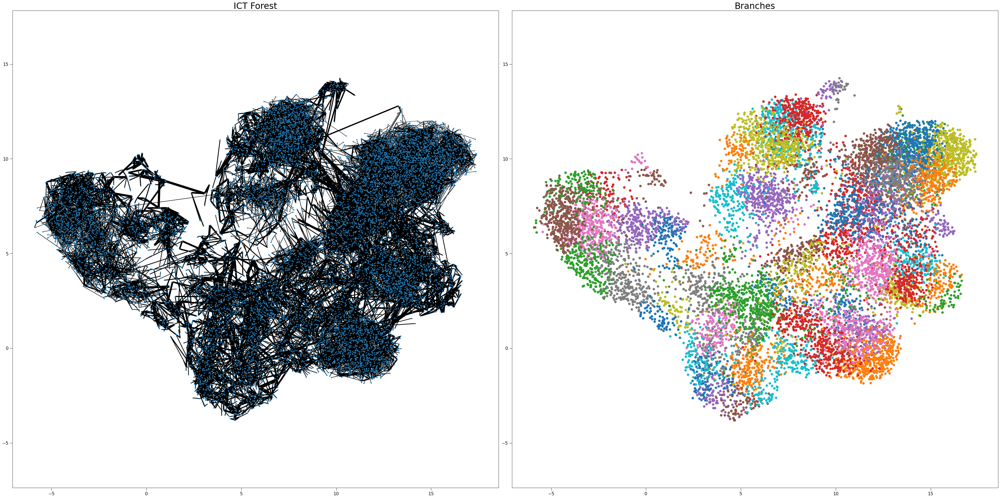

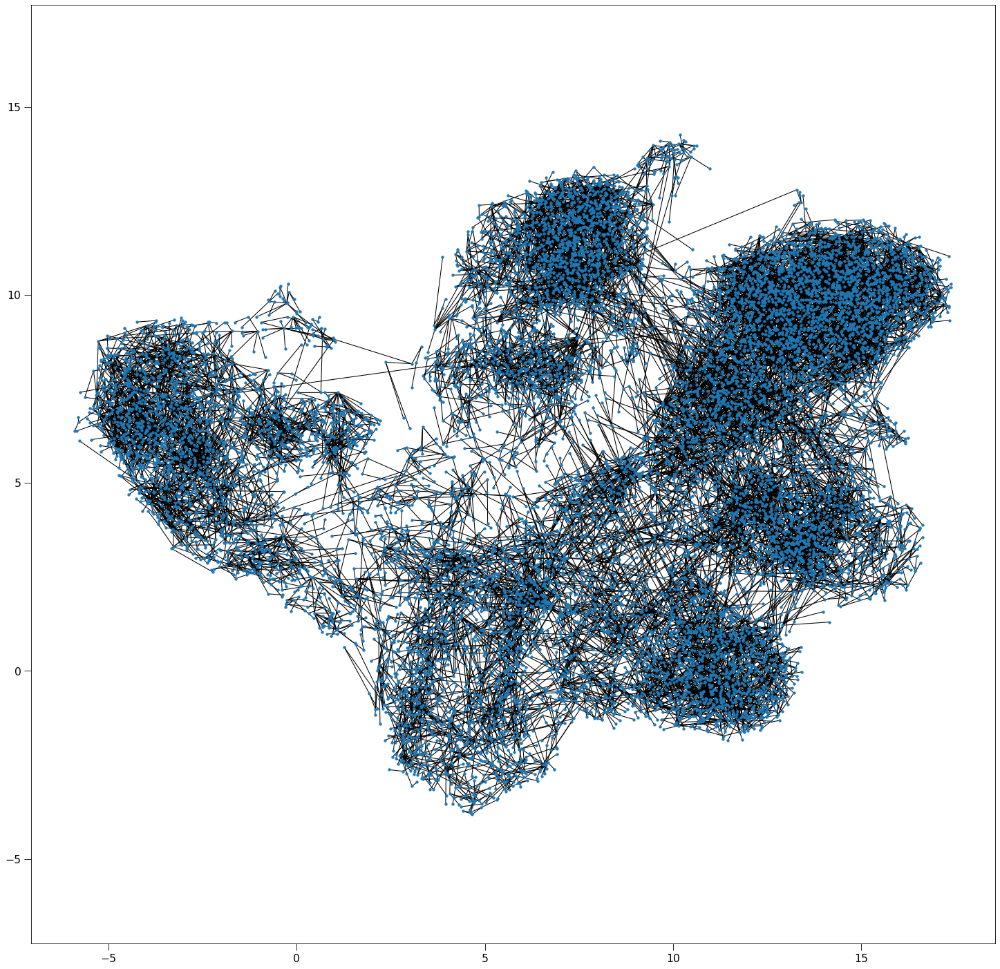

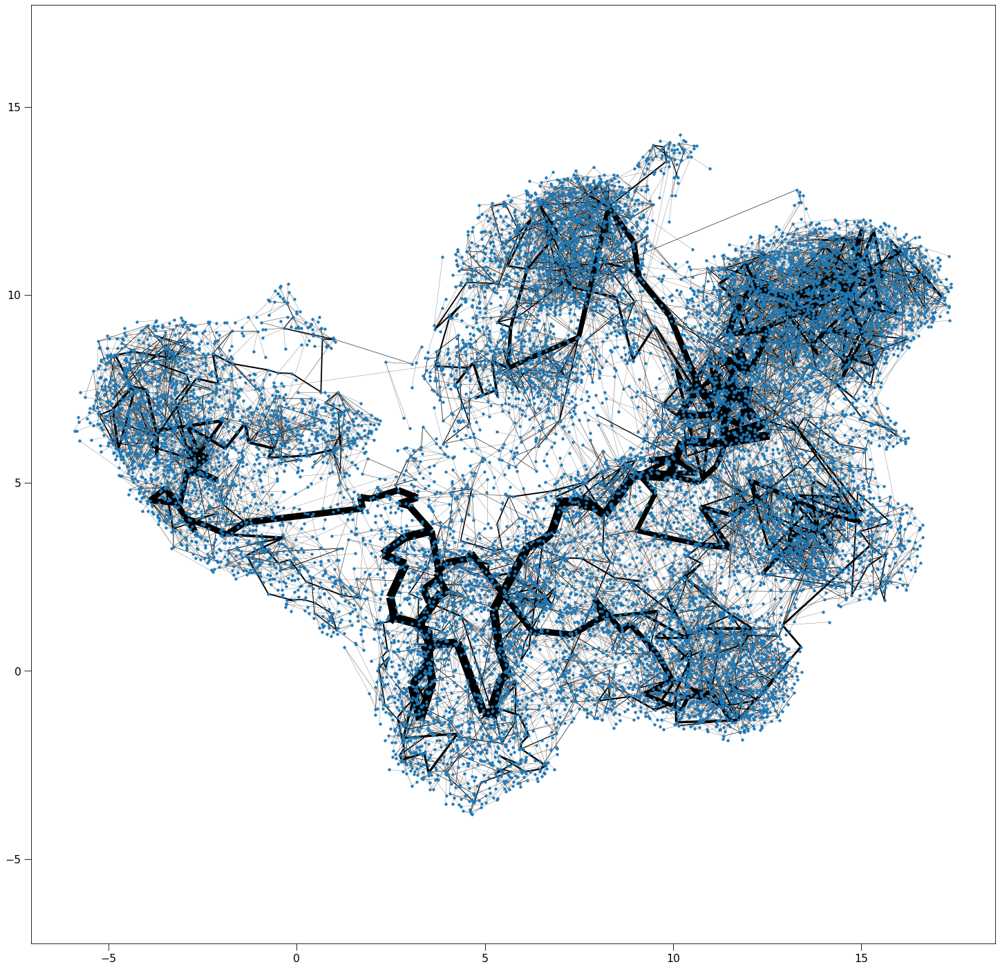

In [11]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

G = patch_together_nearest(G, pca)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [12]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1)
ICT.indexEdges()

create edgeId array:   0%|          | 0/13649 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/13649 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13649 [00:00<?, ?it/s]

update Arr 13649 -> 13649
added 8708 edges early
added 4940 edges early


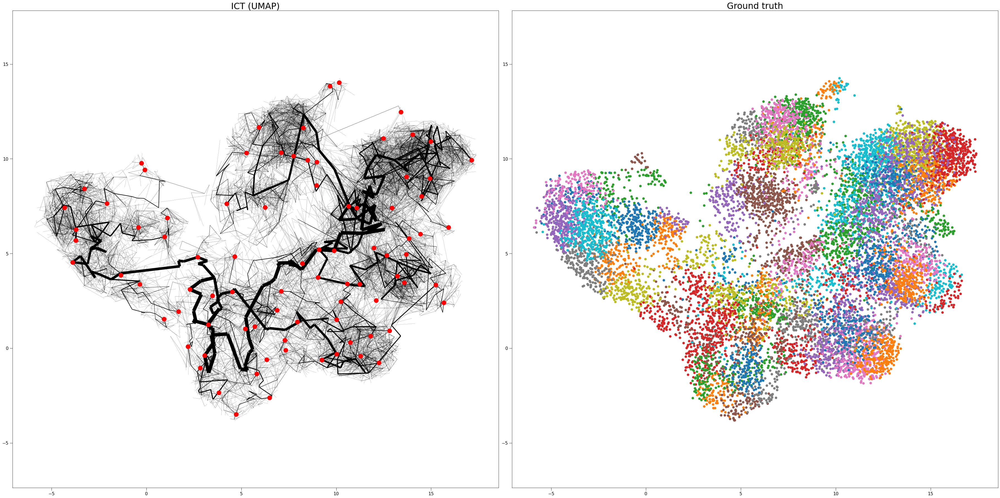

In [13]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

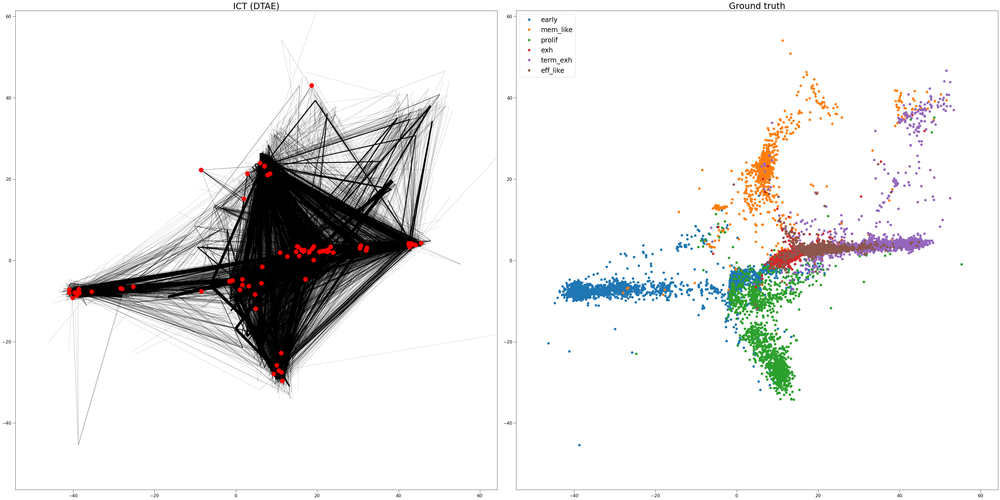

In [14]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

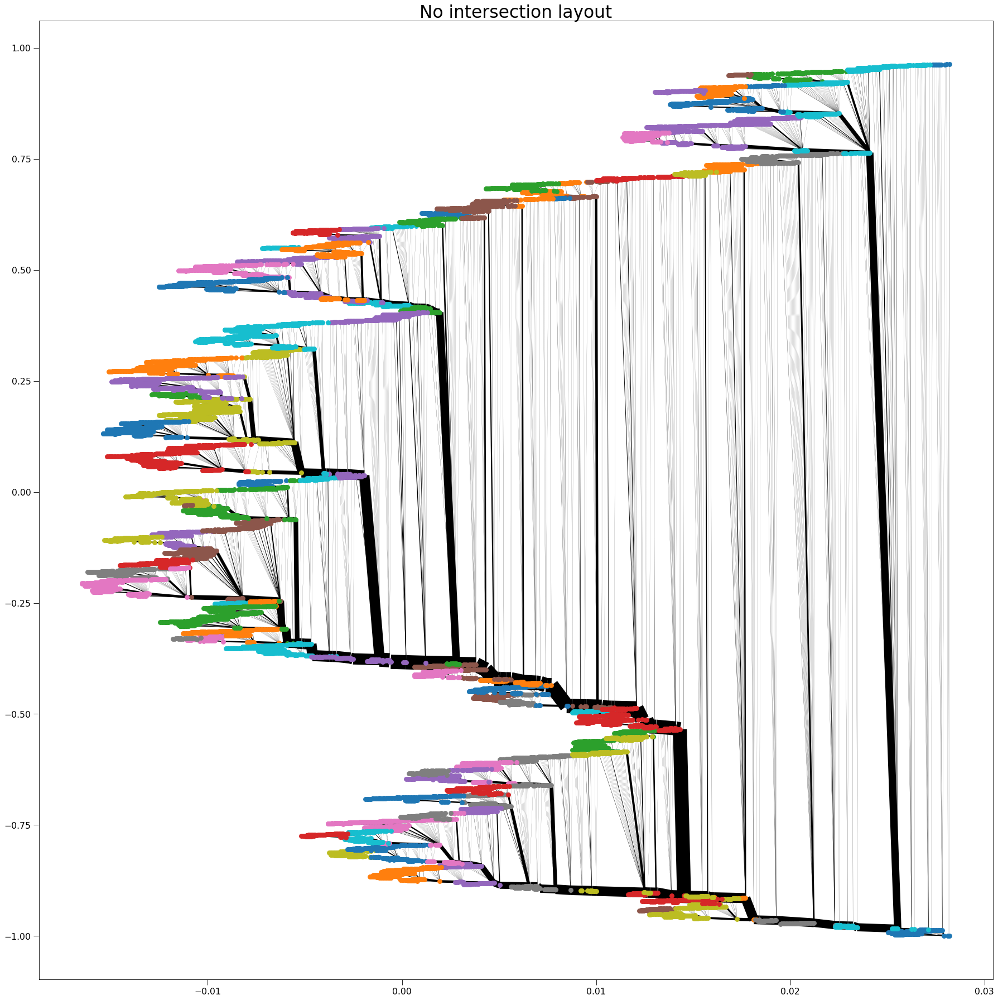

In [15]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()